In [49]:
%pip install lime shap

Note: you may need to restart the kernel to use updated packages.


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

import lime
import shap


In [3]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder
from sklearn.compose import ColumnTransformer

# Load the dataset
file_path = "D:\Sem 5\projects\FDS\liver_cirrhosis.csv"
data = pd.read_csv(file_path)
# Function to remove outliers using IQR
def remove_outliers_iqr(data, columns):
    for column in columns:
        Q1 = data[column].quantile(0.25)  # 25th percentile
        Q3 = data[column].quantile(0.75)  # 75th percentile
        IQR = Q3 - Q1                   # Interquartile range
        lower_bound = Q1 - 1.5 * IQR    # Lower bound
        upper_bound = Q3 + 1.5 * IQR    # Upper bound
        
        # Filter the data
        data = data[(data[column] >= lower_bound) & (data[column] <= upper_bound)]
    return data

# Apply the function to numeric columns
numeric_columns = data.select_dtypes(include=['float64', 'int64']).columns

# Save the shape before removing outliers
shape_before = data.shape

# Remove outliers
data = remove_outliers_iqr(data, numeric_columns)

# Print the shapes
print(f"Shape before removing outliers: {shape_before}")
print(f"Shape after removing outliers: {data.shape}")

Shape before removing outliers: (9639, 19)
Shape after removing outliers: (5636, 19)


In [7]:
from imblearn.over_sampling import SMOTE
import pandas as pd

# Load the dataset (already done in your case)
df = pd.read_csv("D:\Sem 5\projects\FDS\liver_cirrhosis.csv")

# Define features (X) and target (y)
features = df.drop('stage', axis=1)  # Drop the target column 'stage'
target = df['stage']  # Define the target as 'stage'

# Perform one-hot encoding for categorical features
features_encoded = pd.get_dummies(features, drop_first=True)

# Apply SMOTE
smote = SMOTE(random_state=42)
X_smote, y_smote = smote.fit_resample(features_encoded, target)

# Check the shape before and after applying SMOTE
print(f"Shape of X before SMOTE: {features_encoded.shape}")
print(f"Shape of X after SMOTE: {X_smote.shape}")

# Print class distribution after SMOTE
print('\nClass distribution after SMOTE:')
print(y_smote.value_counts())


Shape of X before SMOTE: (9639, 20)
Shape of X after SMOTE: (9924, 20)

Class distribution after SMOTE:
stage
1    3308
2    3308
3    3308
Name: count, dtype: int64


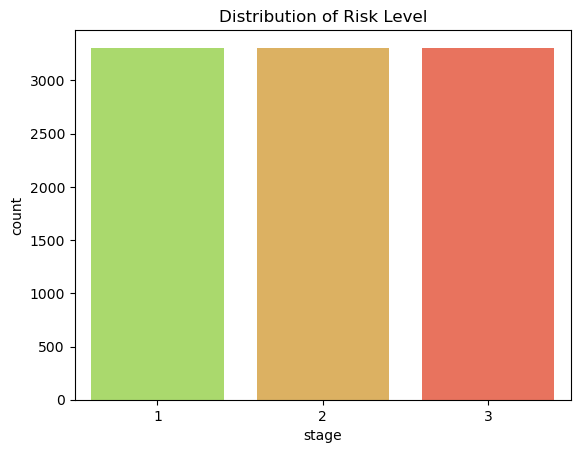

In [9]:
risk_order = [1,2,3]
p_colors = ['#aceb5b', '#f0b74e', 'tomato']
sns.countplot(x=y_smote, order=risk_order, palette=p_colors)
plt.title("Distribution of Risk Level")
plt.show()

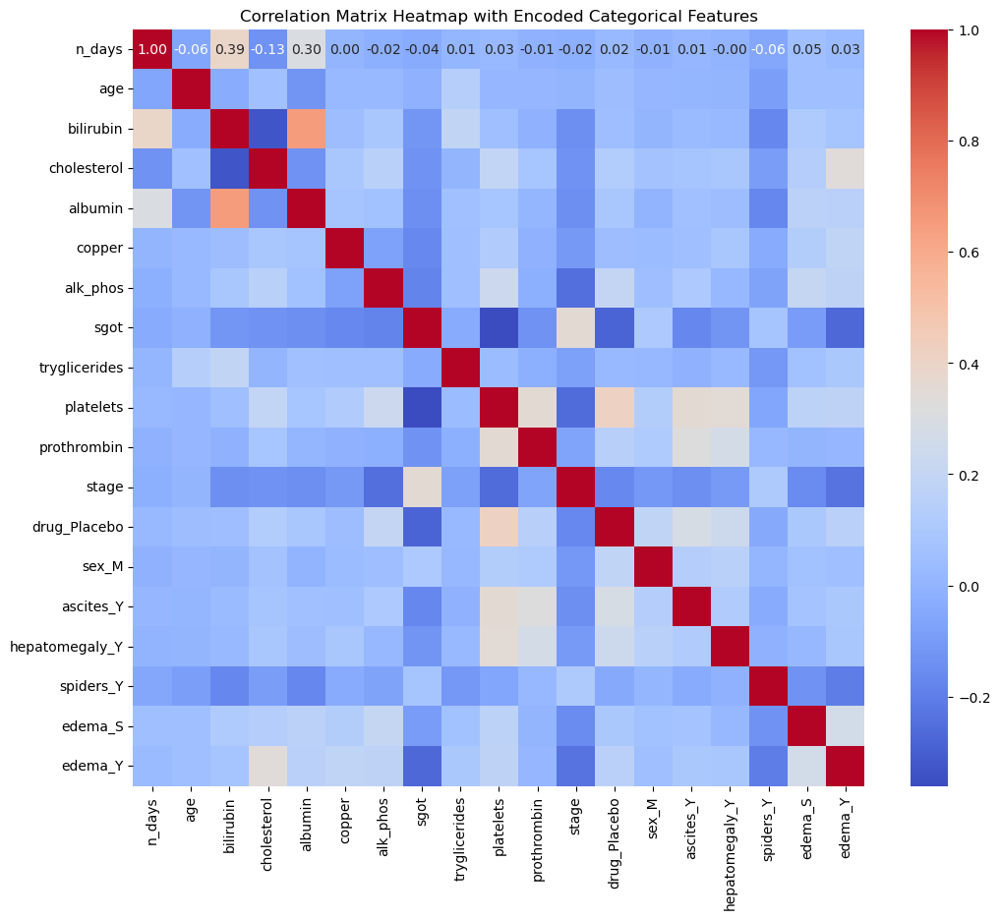

In [11]:
import pandas as pd
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
import seaborn as sns

# Load your dataset
file_path = "D:\Sem 5\projects\FDS\liver_cirrhosis.csv"  # Replace with your actual file path
data = pd.read_csv(file_path)

# Specify categorical and numerical columns based on your dataset
categorical_cols = ['drug', 'sex', 'ascites', 'hepatomegaly', 'spiders', 'edema']
numerical_cols = ['n_days', 'age', 'bilirubin', 'cholesterol', 'albumin', 'copper', 
                  'alk_phos', 'sgot', 'tryglicerides', 'platelets', 'prothrombin', 'stage']

# Define the ColumnTransformer with OneHotEncoder for categorical columns
column_transformer = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(drop='first'), categorical_cols),
        ('num', SimpleImputer(strategy='mean'), numerical_cols)  # Impute missing values in numeric columns
    ],
    remainder='drop'
)

# Fit and transform the data
data_transformed = column_transformer.fit_transform(data)

# Get names for the transformed features
encoded_feature_names = column_transformer.named_transformers_['cat'].get_feature_names_out(categorical_cols)
all_feature_names = list(numerical_cols) + list(encoded_feature_names)

# Ensure the number of features matches
if data_transformed.shape[1] != len(all_feature_names):
    # Add placeholder names for additional columns if needed
    additional_names = [f'extra_feature_{i}' for i in range(data_transformed.shape[1] - len(all_feature_names))]
    all_feature_names.extend(additional_names)

# Re-assert to ensure there is no mismatch in the number of features and column names
assert data_transformed.shape[1] == len(all_feature_names), "Mismatch in number of features and column names."

# Create DataFrame with transformed data
data_transformed_df = pd.DataFrame(data_transformed, columns=all_feature_names)

# Remove any columns with constant values, as they don’t contribute to correlations
data_transformed_df = data_transformed_df.loc[:, data_transformed_df.apply(pd.Series.nunique) > 1]

# Convert all data to numeric, replacing NaNs with zeros if necessary
data_transformed_df_numeric = data_transformed_df.apply(pd.to_numeric, errors='coerce').fillna(0)

# Correlation matrix
corr_matrix = data_transformed_df_numeric.corr()

# Plotting the heatmap of the correlation matrix with two decimal places
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
plt.title("Correlation Matrix Heatmap with Encoded Categorical Features")
plt.show()


In [13]:
# smote split

X_smote_train, X_smote_test, y_smote_train, y_smote_test = train_test_split(X_smote, y_smote, test_size=0.2, random_state=1)

random forest smote

In [61]:
%pip install eli5

Note: you may need to restart the kernel to use updated packages.


In [19]:
import eli5

In [15]:
feature_names = [
    'n_days',         # Number of days 
    'status',         # Status (C: censored, D: death)
    'drug',           # Drug (Placebo or active treatment)
    'age',            # Age in days
    'sex',            # Sex (M/F)
    'ascites',        # Presence of ascites (Y/N)
    'hepatomegaly',   # Presence of hepatomegaly (Y/N)
    'spiders',        # Presence of spiders (Y/N)
    'edema',          # Presence of edema (Y/N)
    'bilirubin',      # Bilirubin level
    'cholesterol',    # Cholesterol level
    'albumin',        # Albumin level
    'copper',         # Copper level
    'alk_phos',       # Alkaline phosphatase level
    'sgot',           # Serum glutamic-oxaloacetic transaminase (SGOT)
    'tryglicerides',  # Triglycerides level
    'platelets',      # Platelet count
    'prothrombin'     # Prothrombin time
]

feature_names

['n_days',
 'status',
 'drug',
 'age',
 'sex',
 'ascites',
 'hepatomegaly',
 'spiders',
 'edema',
 'bilirubin',
 'cholesterol',
 'albumin',
 'copper',
 'alk_phos',
 'sgot',
 'tryglicerides',
 'platelets',
 'prothrombin']

In [21]:
import pandas as pd
import xgboost as xgb
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.pipeline import Pipeline
import eli5

# Load the dataset
file_path = "D:\Sem 5\projects\FDS\liver_cirrhosis.csv"
data = pd.read_csv(file_path)

# Convert categorical columns to category codes
for col in data.select_dtypes(include=['object']).columns:
    data[col] = data[col].astype('category').cat.codes

# Define the target column and features
target_column = 'stage'
X = data.drop([target_column], axis=1)
y = data[target_column]

# Adjust the class labels to start from 0
y = y - 1  # This will shift class labels from [1, 2, 3] to [0, 1, 2]

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply SMOTE to balance the classes
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Feature scaling
scaler = StandardScaler()
X_train_resampled = scaler.fit_transform(X_train_resampled)
X_test = scaler.transform(X_test)

# Define the XGBoost model
xgb_model = xgb.XGBClassifier(random_state=42)

# Create the pipeline with SMOTE and XGBoost
xgb_smote = Pipeline([('smote', smote), ('xgb', xgb_model)])

# Train the model
xgb_smote.fit(X_train_resampled, y_train_resampled)

# Get feature names (if using one-hot encoding, make sure features_encoded is used)
feature_names = X.columns.tolist()

# Display feature importance using ELI5
eli5.show_weights(xgb_smote.named_steps['xgb'], feature_names=feature_names)


Weight,Feature
0.1764,hepatomegaly
0.0788,prothrombin
0.0766,ascites
0.0666,edema
0.0595,albumin
0.0551,n_days
0.0511,platelets
0.0509,drug
0.0501,status
0.0444,sex


2. XGBoost Classifier

In [23]:
import lightgbm as lgb
from sklearn.metrics import accuracy_score, classification_report

# Define and train the LightGBM model
lgbm_smote = lgb.LGBMClassifier(random_state=42)
lgbm_smote.fit(X_smote_train, y_smote_train)

# Make predictions
target_pred = lgbm_smote.predict(X_smote_test)

# Print accuracy
print('Accuracy of LightGBM Classifier on test set: {:.2f}'.format(accuracy_score(y_smote_test, target_pred)*100))

# Print classification report
print(classification_report(y_smote_test, target_pred))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2101
[LightGBM] [Info] Number of data points in the train set: 7939, number of used features: 20
[LightGBM] [Info] Start training from score -1.092710
[LightGBM] [Info] Start training from score -1.095343
[LightGBM] [Info] Start training from score -1.107850
Accuracy of LightGBM Classifier on test set: 89.82
              precision    recall  f1-score   support

           1       0.89      0.88      0.89       646
           2       0.88      0.88      0.88       653
           3       0.92      0.93      0.92       686

    accuracy                           0.90      1985
   macro avg       0.90      0.90      0.90      1985
weighted avg       0.90      0.90      0.90      1985



3. Decision Tree Classifier

few other algorithms


In [55]:
%pip install catboost

   ---------------------------------------- 0.0/101.7 MB ? eta -:--:--
   ---------------------------------------- 0.0/101.7 MB ? eta -:--:--
   ---------------------------------------- 0.0/101.7 MB ? eta -:--:--
   ---------------------------------------- 0.0/101.7 MB 245.8 kB/s eta 0:06:54
   ---------------------------------------- 0.1/101.7 MB 297.7 kB/s eta 0:05:42
   ---------------------------------------- 0.1/101.7 MB 479.3 kB/s eta 0:03:33
   ---------------------------------------- 0.2/101.7 MB 689.9 kB/s eta 0:02:28
   ---------------------------------------- 0.4/101.7 MB 1.3 MB/s eta 0:01:18
   ---------------------------------------- 0.8/101.7 MB 2.0 MB/s eta 0:00:51
    --------------------------------------- 1.4/101.7 MB 3.2 MB/s eta 0:00:32
    --------------------------------------- 1.6/101.7 MB 3.6 MB/s eta 0:00:28
    --------------------------------------- 1.6/101.7 MB 3.6 MB/s eta 0:00:28
    --------------------------------------- 1.9/101.7 MB 3.4 MB/s eta 0:00:30

[LightGBM] [Info] Number of positive: 2946, number of negative: 4278
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000779 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1939
[LightGBM] [Info] Number of data points in the train set: 7224, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.407807 -> initscore=-0.373037
[LightGBM] [Info] Start training from score -0.373037


C:\Users\venka\anaconda3\Lib\site-packages\shap\explainers\_tree.py:448: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn('LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray')


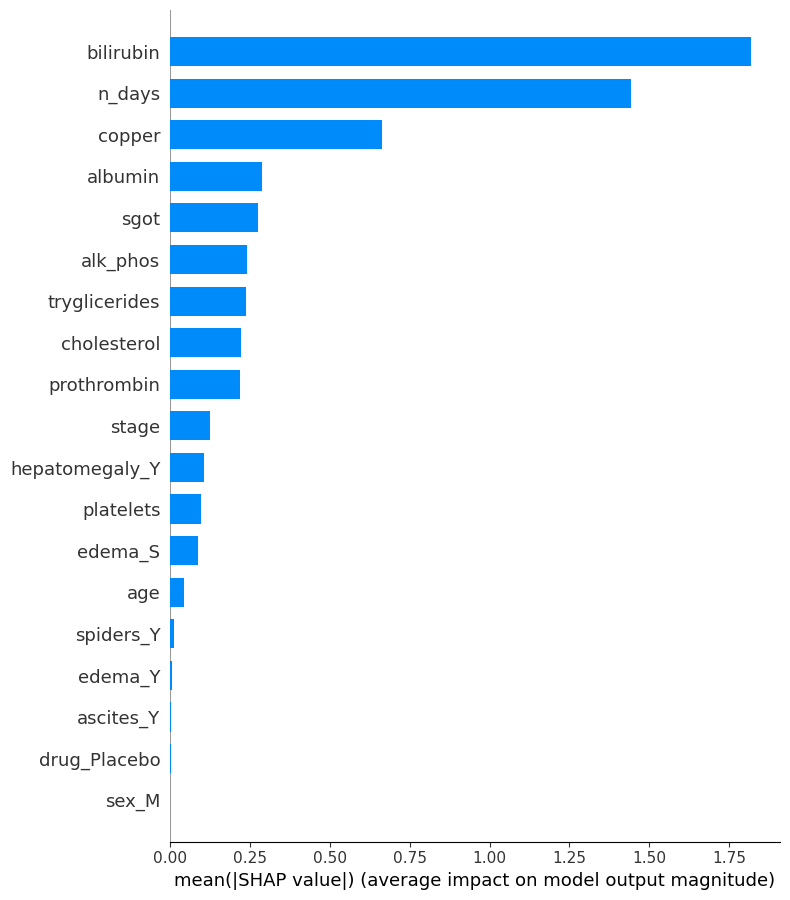

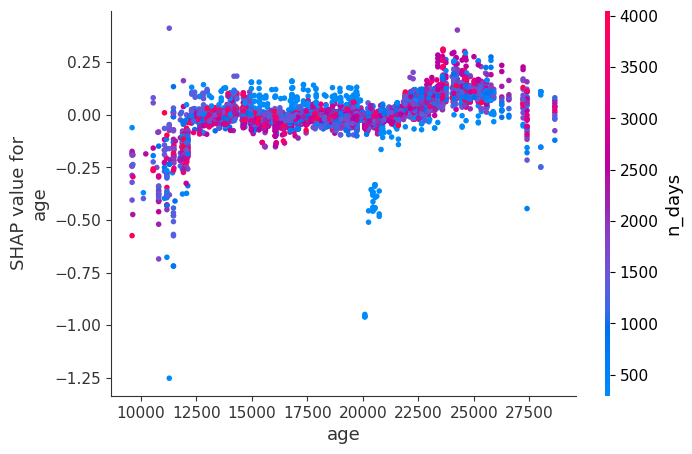

In [39]:
import shap
import lightgbm as lgb
import pandas as pd
from sklearn.model_selection import train_test_split

# Load the dataset
file_path = "D:/Sem 5/projects/FDS/liver_cirrhosis.csv"
data = pd.read_csv(file_path)

# Drop rows with NaN in the target column ('status') before mapping
data = data.dropna(subset=['status'])

# Map 'status' values to [0, 1] (change 'C' to 0 and 'D' to 1)
data['status'] = data['status'].map({'C': 0, 'D': 1})

# Ensure there are no NaN values in the target column after mapping
data = data.dropna(subset=['status'])

# One-hot encode categorical features
categorical_cols = ['drug', 'sex', 'ascites', 'hepatomegaly', 'spiders', 'edema']
data = pd.get_dummies(data, columns=categorical_cols, drop_first=True)

# Split features and target
X = data.drop(['status'], axis=1)
y = data['status']

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the LightGBM model
lgb_model = lgb.LGBMClassifier(objective='binary', random_state=42)
lgb_model.fit(X_train, y_train)

# Create a SHAP explainer for LightGBM
shap_explainer = shap.TreeExplainer(lgb_model)

# Calculate SHAP values for the training set
shap_values = shap_explainer.shap_values(X_train)

# Create a summary plot of SHAP values (bar plot)
shap.summary_plot(shap_values=shap_values, features=X_train, feature_names=X_train.columns, plot_type='bar')

# Optionally, you can visualize SHAP dependence plots for a feature, e.g., 'age'
# This shows how SHAP values for a specific feature relate to the model’s prediction
shap.dependence_plot('age', shap_values, X_train, display_features=X_train)


after smote

SHAP EXPLAINER::

In [31]:
# Calculate SHAP values for a single instance in the test set
shap_values = shap_explainer.shap_values(X_test.iloc[10].values.reshape(1, -1))

# Generate a force plot for the specific instance
shap.force_plot(shap_explainer.expected_value, 
                shap_values, 
                X_test.iloc[10], 
                feature_names=X.columns.tolist())


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002016 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1978
[LightGBM] [Info] Number of data points in the train set: 7711, number of used features: 19
[LightGBM] [Info] Start training from score -1.163851
[LightGBM] [Info] Start training from score -1.061319
[LightGBM] [Info] Start training from score -1.073765


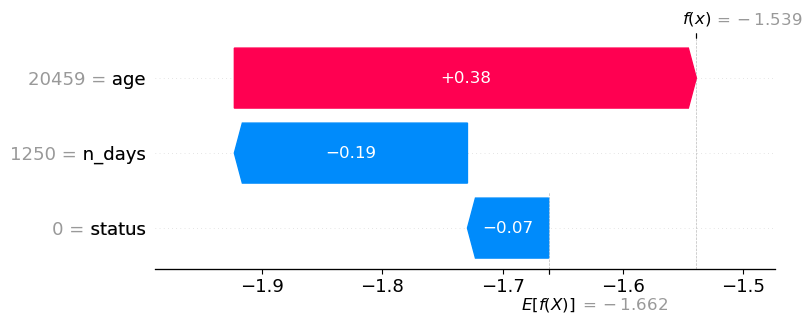

In [37]:
import pandas as pd
import shap
import lightgbm as lgb
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Load the dataset
file_path = "D:/Sem 5/projects/FDS/liver_cirrhosis.csv"
data = pd.read_csv(file_path)

# Drop rows with NaN in the target column ('status') before mapping
data = data.dropna(subset=['status'])

# Map 'status' values to [0, 1] (change 'C' to 0 and 'D' to 1)
data['status'] = data['status'].map({'C': 0, 'D': 1})

# One-hot encode categorical features
categorical_cols = ['drug', 'sex', 'ascites', 'hepatomegaly', 'spiders', 'edema']
data = pd.get_dummies(data, columns=categorical_cols, drop_first=True)

# Split features and target
X = data.drop(['stage'], axis=1)
y = data['stage'] - 1  # Shift class labels to be [0, 1, 2]

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the LightGBM model in multi-class mode
lgb_model = lgb.LGBMClassifier(objective='multiclass', num_class=3, random_state=42)
lgb_model.fit(X_train, y_train)

# Create a SHAP explainer
shap_explainer = shap.TreeExplainer(lgb_model)

# Calculate SHAP values for the test set
shap_values = shap_explainer.shap_values(X_test)

# Choose a specific instance and class index for the waterfall plot
sample_index = 0
class_index = 0  # Choose the class you want to visualize (e.g., 0, 1, or 2)

# Get the base value for the chosen class
base_value = shap_explainer.expected_value[class_index]

# Get the SHAP values for the chosen class and instance
shap_value_for_class = shap_values[class_index][sample_index]

# Create the SHAP Explanation for the waterfall plot
explanation = shap.Explanation(
    values=shap_value_for_class,  # SHAP values for the specific class
    base_values=base_value,  # Base value for the specific class
    data=X_test.iloc[sample_index, :],  # Feature values for the selected instance
    feature_names=X_test.columns  # Feature names
)

# Create the waterfall plot
shap.plots.waterfall(explanation, max_display=10, show=False)

# Display the plot
plt.show()


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001603 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1939
[LightGBM] [Info] Number of data points in the train set: 7224, number of used features: 19
[LightGBM] [Info] Start training from score -0.523923
[LightGBM] [Info] Start training from score -0.896960
[LightGBM] [Info] Start training from score -34.538776


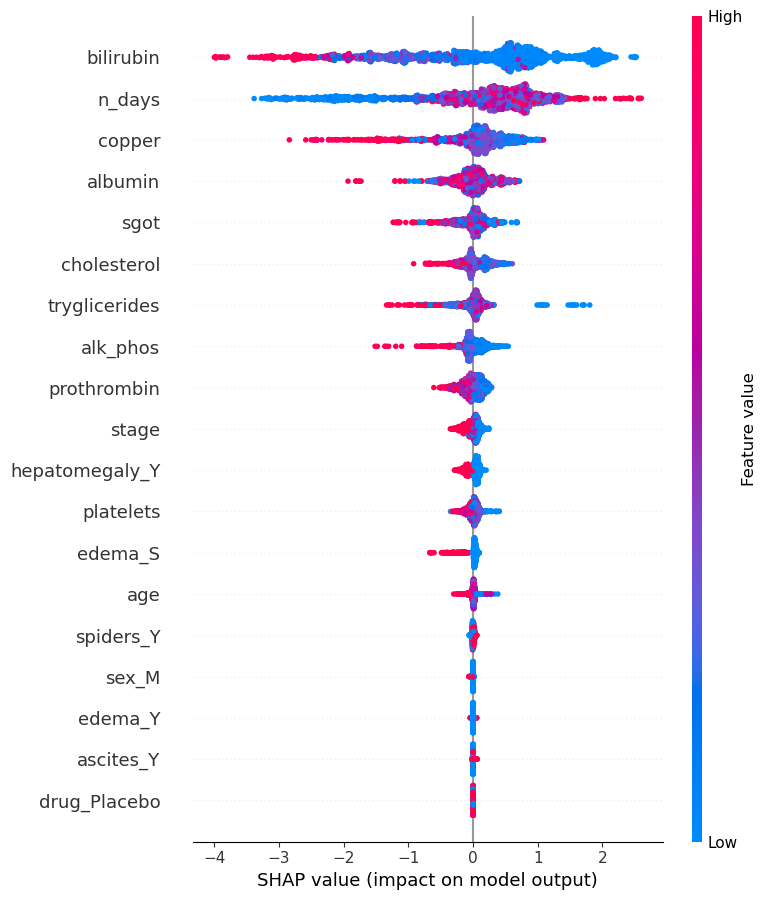

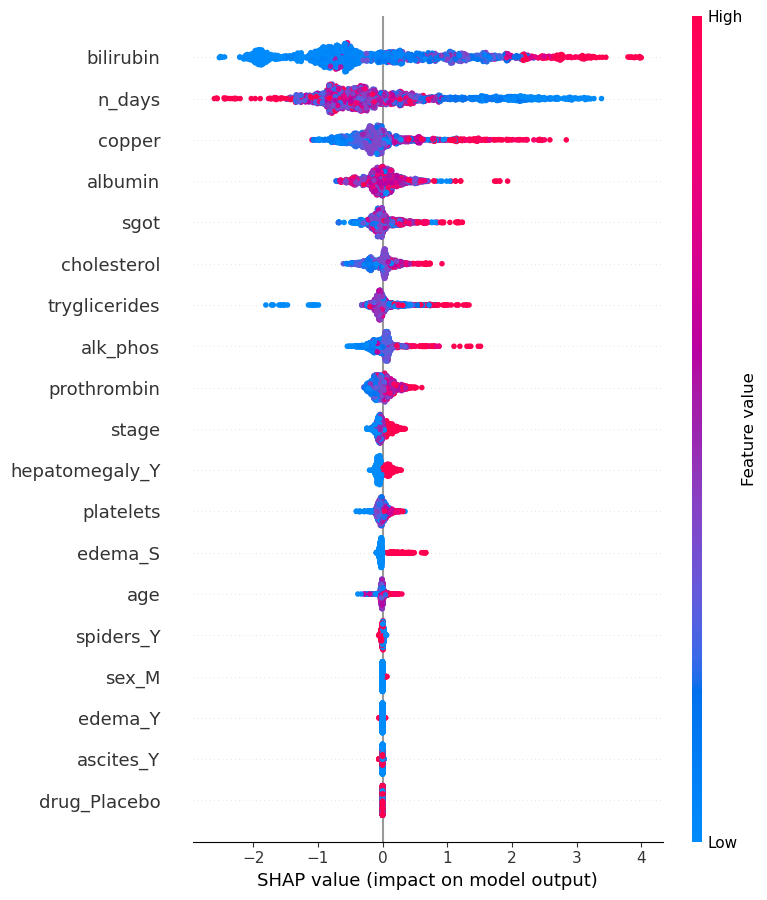

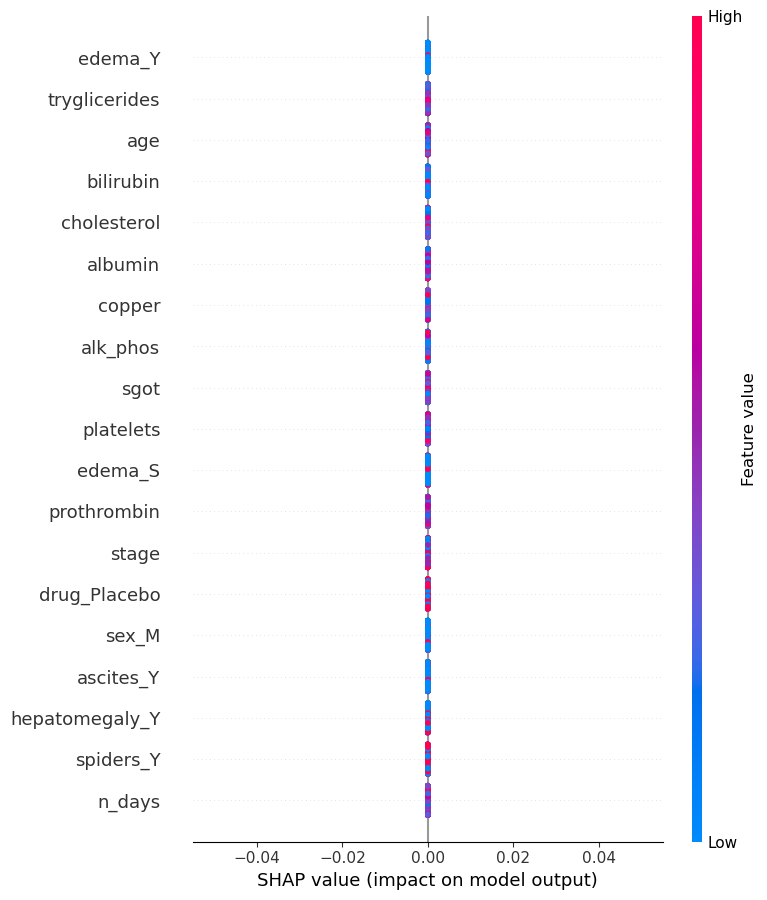

In [41]:
import shap
import lightgbm as lgb
import pandas as pd
from sklearn.model_selection import train_test_split

# Load the dataset
file_path = "D:/Sem 5/projects/FDS/liver_cirrhosis.csv"
data = pd.read_csv(file_path)

# Drop rows with NaN in the target column ('status') before mapping
data = data.dropna(subset=['status'])

# Map 'status' values to [0, 1] (change 'C' to 0 and 'D' to 1)
data['status'] = data['status'].map({'C': 0, 'D': 1})

# Ensure there are no NaN values in the target column after mapping
data = data.dropna(subset=['status'])

# One-hot encode categorical features
categorical_cols = ['drug', 'sex', 'ascites', 'hepatomegaly', 'spiders', 'edema']
data = pd.get_dummies(data, columns=categorical_cols, drop_first=True)

# Split features and target
X = data.drop(['status'], axis=1)
y = data['status']

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the LightGBM model
lgb_model = lgb.LGBMClassifier(objective='multiclass', num_class=3, random_state=42)
lgb_model.fit(X_train, y_train)

# Create the SHAP explainer for LightGBM
explainer = shap.Explainer(lgb_model)

# Calculate SHAP values for the test set
shap_values = explainer(X_test)

# Generate summary plots for each class in shap_values.values
for i in range(3):  # Assuming there are 3 classes
    shap.summary_plot(shap_values.values[:, :, i], X_test, feature_names=X_test.columns)


In [54]:
import pandas as pd
from lime.lime_tabular import LimeTabularExplainer
from sklearn.model_selection import train_test_split
import lightgbm as lgb
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder

# Load data
file_path  = "D:/Sem 5/projects/FDS/liver_cirrhosis.csv" 
data = pd.read_csv(file_path)

# Preprocess target variable (assuming target column is named 'status')
data['status'] = data['status']  # Assuming status is already encoded as 1, 2, 3

# Encode categorical features
categorical_features = ['drug', 'sex', 'ascites', 'hepatomegaly', 'spiders', 'edema']
data = pd.get_dummies(data, columns=categorical_features, drop_first=True)

# Separate features and target
X = data.drop(columns=['status'])
y = data['status']

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train a model (LightGBM as an example)
lgb_model = lgb.LGBMClassifier(random_state=42)
lgb_model.fit(X_train, y_train)

# Evaluate the model
y_pred = lgb_model.predict(X_test)
print(f"Accuracy: {accuracy_score(y_test, y_pred):.2f}")

# Apply LIME Explainer
categorical_features_indices = [X_train.columns.tolist().index(col) for col in ['age', 'n_days']]  # Update based on actual categorical features
explainer = LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=X_train.columns.tolist(),
    class_names=['1', '2', '3'],  # Target classes
    mode='classification',
    categorical_features=categorical_features_indices
)

# Explain a prediction
i = 0  # Index of the test instance to explain
exp = explainer.explain_instance(X_test.iloc[i].values, lgb_model.predict_proba, num_features=10)
exp.show_in_notebook()


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1976
[LightGBM] [Info] Number of data points in the train set: 6747, number of used features: 19
[LightGBM] [Info] Start training from score -0.602388
[LightGBM] [Info] Start training from score -2.774220
[LightGBM] [Info] Start training from score -0.941354
Accuracy: 0.98


In [56]:
from lime.lime_tabular import LimeTabularExplainer

# Assuming X_train is a DataFrame with features
categorical_features = ['age', 'n_days']  # Update with your actual categorical feature names
explainer = LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=X_train.columns.tolist(),
    class_names=['1', '2','3'],  # Update based on your target classes
    mode='classification',
    categorical_features=categorical_features
)


In [58]:
from lime.lime_tabular import LimeTabularExplainer
from sklearn.model_selection import train_test_split
import lightgbm as lgb
from sklearn.metrics import accuracy_score
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import LabelEncoder

# Load data
file_path = "D:/Sem 5/projects/FDS/liver_cirrhosis.csv"
data = pd.read_csv(file_path)

# Preprocess target variable (assuming target column is named 'status')
data['status'] = data['status']  # Assuming status is already encoded as 1, 2, 3

# Encode categorical features
categorical_features = ['drug', 'sex', 'ascites', 'hepatomegaly', 'spiders', 'edema']
data = pd.get_dummies(data, columns=categorical_features, drop_first=True)

# Separate features and target
X = data.drop(columns=['status'])
y = data['status']

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Apply SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Train a model (LightGBM as an example)
model = lgb.LGBMClassifier(random_state=42)
model.fit(X_train_smote, y_train_smote)

# Evaluate the model
y_pred = model.predict(X_test)
print(f"Accuracy: {accuracy_score(y_test, y_pred):.2f}")

# Apply LIME Explainer
categorical_features_indices = [X_train.columns.tolist().index(col) for col in ['age', 'n_days']]  # Update based on actual categorical features
explainer = LimeTabularExplainer(
    training_data=X_train_smote.values,
    feature_names=X_train.columns.tolist(),
    class_names=['1', '2', '3'],  # Target classes
    mode='classification',
    categorical_features=categorical_features_indices
)

# Explain a prediction
i = 0  # Index of the test instance to explain
exp = explainer.explain_instance(X_test.iloc[i].values, model.predict_proba, num_features=10)
exp.show_in_notebook()


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2741
[LightGBM] [Info] Number of data points in the train set: 11082, number of used features: 19
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
Accuracy: 0.97


In [62]:
# Assuming lgb_smote is your trained LightGBM model and X_test is your test set features

# Visualize the LIME explanation on LightGBM after SMOTE
for sample_index in range(0, 4):
    exp = explainer.explain_instance(X_test.values[sample_index], lgb_smote.predict_proba, num_features=6, top_labels=1)
    exp.show_in_notebook(show_table=True, show_all=False)
    exp.save_to_file(f'lime_lgb_after_smote{sample_index}.html')
